In [1]:
import pandas as pd
import numpy as np
df = pd.read_csv("international-migration-September-2020-estimated-migration-by-age-sex.csv")
df = df[(df.sex != "TOTAL") & (df.direction != "Net") & (df.age != "TOTAL")]
df.sample(50)

,year_month,month_of_release,passenger_type,direction,sex,age,estimate,standard_error,status
6512,2016-03,2020-09,Long-term migrant,Arrivals,Male,40-44 years,366,0,Final
4060,2013-07,2020-09,Long-term migrant,Arrivals,Female,15-19 years,658,0,Final
5038,2003-05,2020-09,Long-term migrant,Arrivals,Male,25-29 years,587,0,Final
5481,2003-08,2020-09,Long-term migrant,Arrivals,Male,30-34 years,595,0,Final
17495,2003-04,2020-09,Long-term migrant,Departures,Female,70-74 years,23,0,Final
12430,2002-11,2020-09,Long-term migrant,Departures,Male,15-19 years,409,0,Final
11254,2013-07,2020-09,Long-term migrant,Arrivals,Male,90+ years,1,0,Final
18099,2016-12,2020-09,Long-term migrant,Departures,Female,75-79 years,16,0,Final
19147,2014-04,2020-09,Long-term migrant,Departures,Male,85-89 years,6,0,Final
18315,2016-08,2020-09,Long-term migrant,Departures,Male,75-79 years,14,0,Final


In [2]:
df.describe()

,estimate,standard_error
count,17789.000000,17789.000000
mean,233.518354,0.450222
std,245.343224,2.480792
min,0.000000,0.000000
25%,39.000000,0.000000
50%,162.000000,0.000000
75%,327.000000,0.000000
max,2028.000000,49.000000


In [3]:
%matplotlib inline
df.estimate.sum()

4154058

<AxesSubplot:xlabel='year_month'>

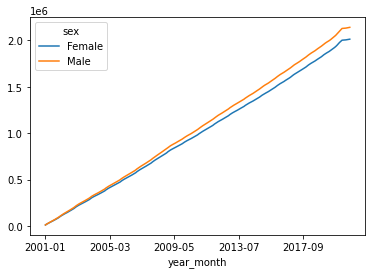

In [4]:
df.groupby(["year_month", "sex"]).sum().reset_index().pivot(values="estimate", index=["year_month"], columns="sex").cumsum().plot.line()

<AxesSubplot:xlabel='age'>

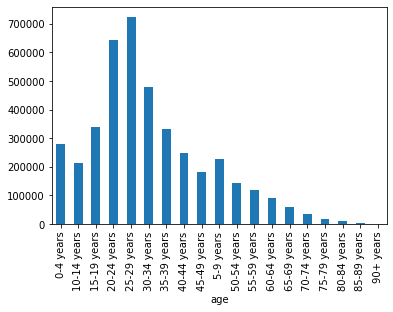

In [5]:
df.groupby("age").estimate.sum().plot.bar()

<AxesSubplot:xlabel='year'>

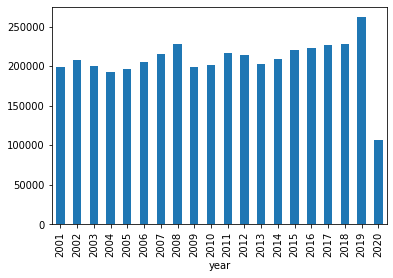

In [6]:
df1 = df.copy(True)
df1["year"] = df1.year_month.apply(lambda v: int(v[:4]))
df1.groupby("year").estimate.sum().plot.bar()

<AxesSubplot:ylabel='Frequency'>

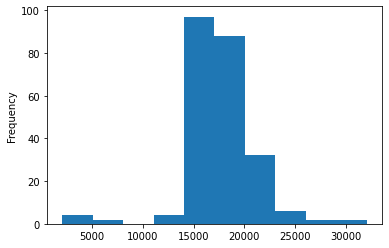

In [7]:
df1.groupby("year_month").sum().reset_index().estimate.plot.hist()

<AxesSubplot:ylabel='None'>

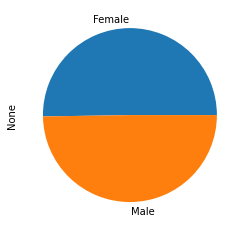

In [8]:
df.groupby("sex").size().plot.pie()

<AxesSubplot:>

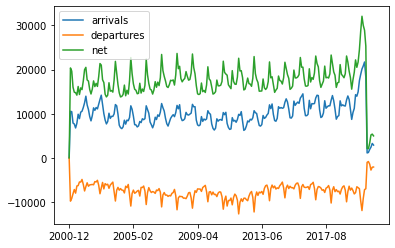

In [9]:
df2 = df.copy(True)
df2["arrivals"] = df2.apply(lambda x: x["estimate"] if x["direction"]=="Arrivals" else 0, axis=1)
df2["departures"] = df2.apply(lambda x: -x["estimate"] if x["direction"]=="Departures" else 0, axis=1)
df2["net"] = df2.apply(lambda x: x["arrivals"] - x["departures"], axis=1)
df3 = df2.groupby("year_month").sum().filter(["arrivals", "departures", "net"])
df4 = pd.DataFrame([[0, 0, 0]], columns=["arrivals", "departures", "net"], index=["2000-12"])
df3 = df3.append(df4).sort_index()
df3.plot.line()

,age,direction
0,4,Arrivals
1,4,Arrivals
2,4,Arrivals
3,4,Arrivals
4,4,Arrivals
...,...,...
4154053,94,Departures
4154054,94,Departures
4154055,94,Departures
4154056,94,Departures


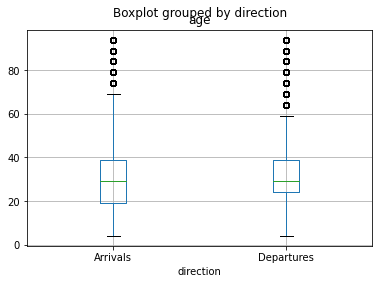

In [20]:
df5 = df.copy(True)
df5["age"] = df5.apply(lambda x: int(x["age"].split(" ")[0].replace("90+", "90-94").split("-")[1]), axis=1)
df5 = df5.groupby(["age", "direction"]).estimate.sum().reset_index()
df5 = pd.DataFrame(df5.values.repeat(df5.estimate, axis=0), columns=df5.columns).filter(["age", "direction"])
df5.boxplot(by="direction", column="age")
df5